# Overview

This week we'll talk about advanced network measures (beyond the degree distribution). We will use these tools to make sense of the Rapper network. 
This is the outline for today:

* Visualization and qualitative analysis of the Rapper Network
* Properties of the network structure, including how attributes and other properties shape the network

> _Reading_: This week, the reading is mostly for reference. It's for you to have a place to go, if you want more detailed information about the topics that I cover in the video lectures. Thus, I recommend you check out **Chapter 9** of the network science book. In particular, we'll delve into [Section 9.4](http://networksciencebook.com/chapter/9#modularity) in the exercises below. We will also talk a little bit about degree correlations - you can read about those in [Chapter 7](http://networksciencebook.com/chapter/7)\.


![Text](https://wallpapers.com/images/high/cool-rapper-zs7xat10uqylszmy.webp "Great image choice, Jonas")


---
# Part A: Let's  visualise!

We will continue to work with the network from last week, see the lecture for [Week 4](https://nbviewer.jupyter.org/github/socialcomplexitylab/socialgraphs2021/blob/main/lectures/Week4.ipynb) for details. This is important! Actually, in order to continue with the lecture, you *need* to complete Week 4. 


*Exercise 1:* Build the right graph for visualization:

>1. Use NetworkX `DiGraph` to store the network of rappers. Remember that rappers are linked if they have a corresponding link between their Wiki contents.
>   * **Additionally**, extract the largest component - it will make our work with visualizations much easier (note: removing *isolated* nodes (with no links) does not guarantee that you are left with the largest component).
>     - *Note 1*: You probably have the right graph if you have around 730 nodes and 6000 edges.
>     - *Note 2*: For directed graphs use `weakly connected component` to extract the largest component.
>     - *Note 3*: Further analysis is done with the largest component
>2. As you build the graph, store the attributes of the nodes (their `coast`). On top of that, let's also store the `length of the content` as one of the attributes of the node (i.e. count the number of *words* you have in each rapper's page). By storing this information as nodal features, we keep all the relevant data in one place. The safe way to count words without counting symbols is to use `regex`, but simpler methods are OK.

In [1]:
import networkx as nx
# Import the graph rappers.gexf into a nx DiGraph
G = nx.read_gexf('rappers.gexf')

# Find the largest weakly connected component
largest_weakly_cc = max(nx.weakly_connected_components(G), key=len)

# Create a subgraph of G consisting only of the nodes in the largest weakly connected component
G = G.subgraph(largest_weakly_cc)

# Number of nodes and edges in G
print("Number of nodes in G: ", G.number_of_nodes())
print("Number of edges in G: ", G.number_of_edges())

Number of nodes in G:  724
Number of edges in G:  5776


In [2]:
# Check if all the nodes have the attribute coast
print("Does all the nodes have the attribute coast? ", all([G.nodes[n]['coast'] for n in G.nodes()]))

# Chech if all the nodes have the word count attribute
print("Does all the nodes have the word count attribute? ", all([G.nodes[n]['content_length'] for n in G.nodes()]))

Does all the nodes have the attribute coast?  True
Does all the nodes have the word count attribute?  True


*Exercise 2:* Let's build a simple visualization of the network
>1. For the sake of the visualisation, let's convert our network to *undirected graph* (tip: There is a NetworkX command to help you).
>   * *Note*: Keep the directed graph, we will use it in couple of the following exercises
>2. Use the NetworkX command `nx.draw_kamada_kawai` to draw the resulting undirected network. (You can find [background on the algorithm here](https://en.wikipedia.org/wiki/Force-directed_graph_drawing).)  
>   * Node color should depend on the `coast` attribute (i.e. use different colors for west-coast and east-coast rappers).
>   * Set up your plot so that node-size depends on the node *degree*
>   * **Optional**: Set up you plot so that edge color depends on the `role` attribute. If an edge connects west-coast rappers, assign `color_a`, if the edge connects east-coast rappers assign `color_b`, in other cases assign `color_c` (i.e. when rapper from different coasts are connected). (Here, you get to decide on the colors.)

In [3]:
# Convert G into an undirected graph and save it in a new graph
G_undirected = G.to_undirected()

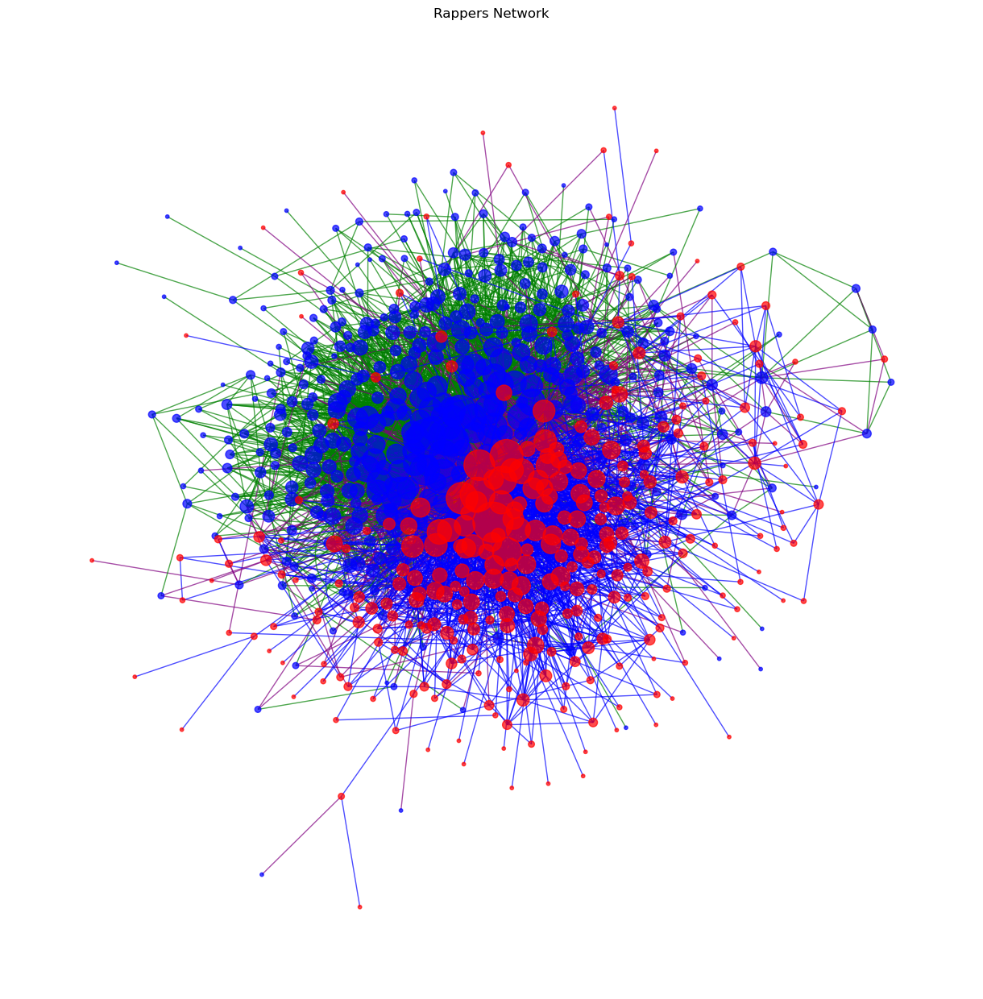

In [4]:
import matplotlib.pyplot as plt

# Set up node sizes based on the node degree
node_sizes = [G_undirected.degree(node) * 10 for node in G_undirected.nodes()]

# Map 'EastCoast' to 'blue' and 'WestCoast' to 'red'
node_colors = ['blue' if data['coast'] == 'EastCoast' else 'red' for node, data in G_undirected.nodes(data=True)]

import matplotlib.pyplot as plt
import networkx as nx
import re

# Set up node colors based on the 'coast' attribute
node_colors = ['blue' if data['coast'] == 'EastCoast' else 'red' for node, data in G_undirected.nodes(data=True)]

# Set up node sizes based on the node degree
node_sizes = [G_undirected.degree(node) * 10 for node in G_undirected.nodes()]

# Define the colors
color_a = 'blue'  # for edges connecting west-coast rappers
color_b = 'green'  # for edges connecting east-coast rappers
color_c = 'purple'  # for edges connecting rappers from different coasts

# Set up edge colors
edge_colors = []
for u, v in G_undirected.edges():
    if G_undirected.nodes[u]['coast'] == 'WestCoast' and G_undirected.nodes[v]['coast'] == 'WestCoast':
        edge_colors.append(color_a)
    elif G_undirected.nodes[u]['coast'] == 'EastCoast' and G_undirected.nodes[v]['coast'] == 'EastCoast':
        edge_colors.append(color_b)
    else:
        edge_colors.append(color_c)

# Draw the graph using the Kamada-Kawai layout
plt.figure(figsize=(12, 12))
nx.draw_kamada_kawai(G_undirected, node_color=node_colors, node_size=node_sizes, edge_color=edge_colors, with_labels=False, alpha=0.7)
plt.title('Rappers Network')
plt.show()



*Exercise 3:* From the previous plot it is more difficult to observe any specific structure in the network. We can make even better visualisations with `ForceAtlas2` package:
>1. [Force Atlas 2 algorithm](https://github.com/bhargavchippada/forceatlas2) helps to determine the positions of the nodes (see what the result looks like below).
>2.You can install the  package typing `pip install fa2` in the terminal. The [github page](https://github.com/bhargavchippada/forceatlas2) explains how to use the package to get coordinates for each node.
>   * (**Hint**: if you install force atlas and Python can't find the package it might be because you computer tries to use the system's `pip`, therefore, try installing using the Anaconda pip explicitly ( on mac you would use `~/anaconda2/bin/pip install fa2`).
> * Visualize the network using the [Networkx draw function](https://networkx.github.io/documentation/stable/reference/generated/networkx.drawing.nx_pylab.draw.html#networkx.drawing.nx_pylab.draw), and node-coordinates from the force atlas algorithm. As in the previous Exercise:
>   * Node color should depend on the `coast` attribute (i.e. use different colors for west-coast and east-coast rappers)
>   * Node size should depend on the node *degree*
>   * **Optional**: edge color should depend on the `coast` attribute. If an edge connects west-coast rappers, assign `color_a`, if the edge connects east-coast rappers from  assign `color_b`, in other cases assign `color_c` (i.e. when connected rappers are from different coasts).
> * Play with the force atlas algorithm parameters to obtain a visualization you like. It may look similar to the one below (but not necessarily). 
> * Describe the structure you observe. Can you identify nodes with a privileged position in the network? Do you observe chains of connected nodes? Do you see any interesting group of nodes (can you guess who's involved)?



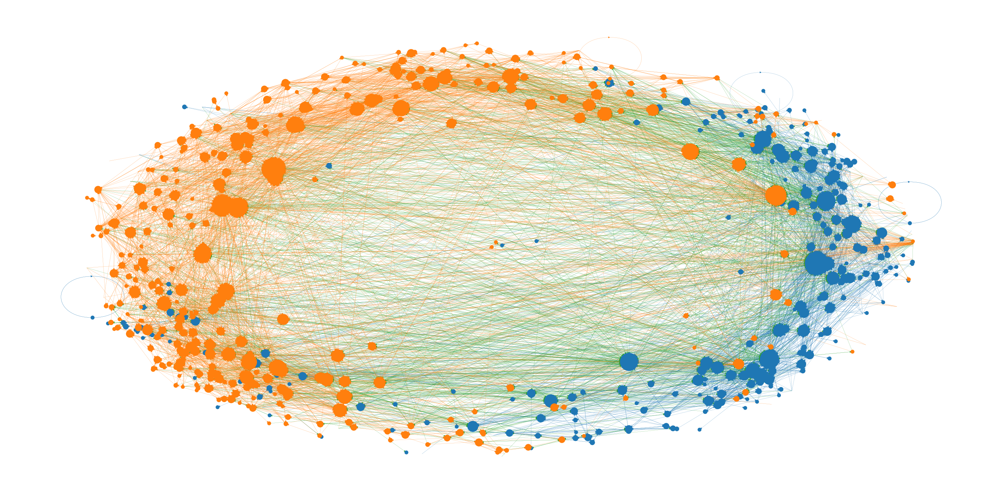

In [4]:
import fa2

100%|██████████| 2000/2000 [00:23<00:00, 83.39it/s]


BarnesHut Approximation  took  4.21  seconds
Repulsion forces  took  18.28  seconds
Gravitational forces  took  0.11  seconds
Attraction forces  took  0.15  seconds
AdjustSpeedAndApplyForces step  took  0.65  seconds


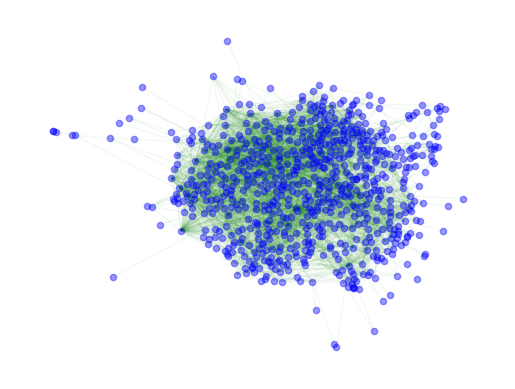

In [7]:

from fa2 import ForceAtlas2
import matplotlib.pyplot as plt

forceatlas2 = ForceAtlas2(
                        # Behavior alternatives
                        outboundAttractionDistribution=True,  # Dissuade hubs
                        linLogMode=False,  # NOT IMPLEMENTED
                        adjustSizes=False,  # Prevent overlap (NOT IMPLEMENTED)
                        edgeWeightInfluence=1.0,

                        # Performance
                        jitterTolerance=1.0,  # Tolerance
                        barnesHutOptimize=True,
                        barnesHutTheta=1.2,
                        multiThreaded=False,  # NOT IMPLEMENTED

                        # Tuning
                        scalingRatio=2.0,
                        strongGravityMode=False,
                        gravity=1.0,

                        # Log
                        verbose=True)

positions = forceatlas2.forceatlas2_networkx_layout(G_undirected, pos=None, iterations=2000)
nx.draw_networkx_nodes(G_undirected, positions, node_size=20, node_color="blue", alpha=0.4)
nx.draw_networkx_edges(G_undirected, positions, edge_color="green", alpha=0.05)
plt.axis('off')
plt.show()

![](https://github.com/SocialComplexityLab/socialgraphs2023/blob/main/files/Visualfa2Rappers.pngraw=true)

*Exercise 4*: We continue with a qualitative inspection of the rapper Wiki pages, that will help us to intepret our results. We investigate the reasons for links between rappers to exist on rapper Wiki.

>1. Consider the top 3 nodes with highest in-degree in the network. Open the corresponding Wiki pages.
>   * Consider the set of neighbours pointing towards the node found above. Look for them in the page. 
>   * What is the relation between the rappers you identified and his/her network neighbours? (e.g., do they come from the same coast, did they write songs together, etc.). You don't need to come up with a grand theory of rap music here, I just want you to think about how links come about.
>   * Repeat the exercise for the top 3 out-degree node. 
>   * Are there differences between reasons for out- and in-links? Again, there's no right answer here. I just want you to think about some of the reasons why links may occur between rappers.
>2. Are there any nodes with high out-degree and with few incoming connections? If yes, open the Wiki pages of such rappers and explain what happens?
>3. Are there any nodes with high in-degree and few outcoming connections? Again, open the Wiki pages of such rappers and explain what happens? 
>4. Do any nodes have particularly many links to rappers from the opposite coast? If yes, try and find out what is going on.

# Part B:  Advanced tools 

> **Video lecture**: [*Network measures*.](https://www.dropbox.com/scl/fi/8dal16z6z2b7lqhwq2f1j/NetworkMeasures.mp4?rlkey=c0imv3tewun2ivoxgtqrrov31&dl=0) Link: https://www.dropbox.com/scl/fi/8dal16z6z2b7lqhwq2f1j/NetworkMeasures.mp4?rlkey=c0imv3tewun2ivoxgtqrrov31&dl=0

*Exercise 1:* Last time we visually analyzed (plotted) the degree distributions of our network. Now, let's analyze it using some of the tools from previous lectures. For this exercise we are going to look at the *directed* graph (rememeber, we asked you to keep one?).

>1. What are the average, median, mode, minimum and maximum value of the in-degree? And of the out-degree? How do you intepret the results?
>    * On top of that, calculate same statistics separately for the network that is spanned only by east-coast rappers and only by west-coast rappers. How do you interpret the results? 

In [13]:
# Find the average, median, mode, minimum and maximum value of the in-degree in G
in_degrees = [G.in_degree(n) for n in G.nodes()]
print("Average in-degree: ", sum(in_degrees) / len(in_degrees))
print("Median in-degree: ", sorted(in_degrees)[len(in_degrees) // 2])
print("Mode in-degree: ", max(set(in_degrees), key=in_degrees.count))
print("Minimum in-degree: ", min(in_degrees))
print("Maximum in-degree: ", max(in_degrees))
print()
# The same for the out degrees
out_degrees = [G.out_degree(n) for n in G.nodes()]
print("Average out-degree: ", sum(out_degrees) / len(out_degrees))
print("Median out-degree: ", sorted(out_degrees)[len(out_degrees) // 2])
print("Mode out-degree: ", max(set(out_degrees), key=out_degrees.count))
print("Minimum out-degree: ", min(out_degrees))
print("Maximum out-degree: ", max(out_degrees))

Average in-degree:  7.9779005524861875
Median in-degree:  3
Mode in-degree:  0
Minimum in-degree:  0
Maximum in-degree:  127

Average out-degree:  7.9779005524861875
Median out-degree:  6
Mode out-degree:  2
Minimum out-degree:  0
Maximum out-degree:  52


__Interpretation__
* Average In-Degree (7.98):

The average in-degree of around 8 suggests that, on average, each rapper is linked to by about 8 other rappers in the network. This could imply a moderate level of connectivity or referencing among the rappers.

* Median In-Degree (3):

The median in-degree of 3 is significantly lower than the average. This suggests that the distribution of in-degrees is skewed to the right, meaning there are a few nodes (rappers) with very high in-degrees that are raising the average.

* Mode In-Degree (0):

The mode being 0 indicates that the most common in-degree is 0, meaning there are more nodes with no incoming links than nodes with any other number of incoming links. This could suggest that there are many rappers who are not referenced or linked to by other rappers in the network.

* Minimum In-Degree (0):

This indicates that there are nodes in the graph with no incoming links, which aligns with the mode being 0.

* Maximum In-Degree (127):

The maximum in-degree of 127 is quite high, especially compared to the average and median. This suggests that there are a few rappers who are highly referenced or linked to by many other rappers in the network.

>2. Let's also look at the *[exponent of the degree distribution](http://networksciencebook.com/chapter/4#degree-exponent)*
>    * To calculate it, you can install `powerlaw` package (I could not install in conda, so I used `pip install powerlaw`)
>    * Use `powerlaw.Fit(degree).alpha` for fitting
>    * Find the degree exponent for in-, out- and total- degree distribution. What does it say about our network?
>    * When analyzing the plots of in- and out- degree distribution last week, did you come up to the same conclusions?
>    * Some long time ago, couple of scientist have analyzed the network that is spanned by the whole Wikipedia (paper is called [Wikipedias: Collaborative web-based encyclopedias as complex networks](https://journals.aps.org/pre/abstract/10.1103/PhysRevE.74.016115); to access this paper, use findit.dtu.dk or read the preprint on [arXiv](https://arxiv.org/abs/physics/0602149)). Do your findings correspond to the results described in Chapter **III.A**? If not, why? 

In [17]:
import powerlaw

# Calculate in-degrees, out-degrees, and total degrees
in_degrees = [G.in_degree(n) for n in G.nodes()]
out_degrees = [G.out_degree(n) for n in G.nodes()]
total_degrees = [d for n, d in G.degree()]

# Fit powerlaw
in_alpha = powerlaw.Fit(in_degrees).alpha
out_alpha = powerlaw.Fit(out_degrees).alpha
total_degrees_alpha = powerlaw.Fit(total_degrees).alpha

print("In-degree exponent: ", in_alpha)
print("Out-degree exponent: ", out_alpha)
print("Total degree exponent: ", total_degrees_alpha)

Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
In-degree exponent:  2.7226864758498035
Out-degree exponent:  11.725907733394754
Total degree exponent:  3.553868452817303


Values less than or equal to 0 in data. Throwing out 0 or negative values
Values less than or equal to 0 in data. Throwing out 0 or negative values


>3. Plot a scatter plot of the the in- versus out- degree for all rappers. Comment on the relation between the two.

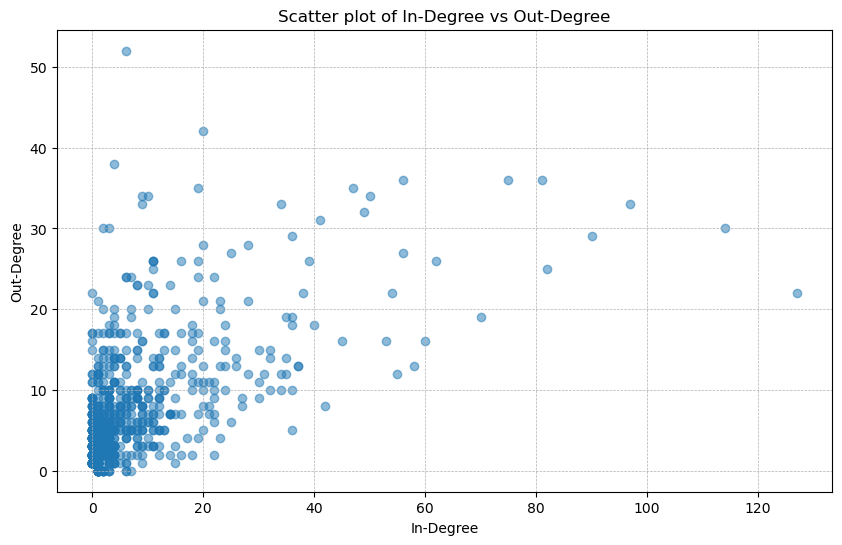

In [21]:
# Create a scatter plot
plt.figure(figsize=(10,6))
plt.scatter(in_degrees, out_degrees, alpha=0.5)
plt.title('Scatter plot of In-Degree vs Out-Degree')
plt.xlabel('In-Degree')
plt.ylabel('Out-Degree')
#plt.xscale('log')
#plt.yscale('log')
plt.grid(True, which="both", ls="--", linewidth=0.5)
plt.show()

In [5]:
# Find the node with the highest in-degree
max_in_degree_node = max(G.in_degree(), key=lambda x: x[1])

print("Node with highest in-degree: ", max_in_degree_node[0])
print("Highest in-degree: ", max_in_degree_node[1])

# Find the node with the lowest in-degree
max_out_degree_node = max(G.out_degree(), key=lambda x: x[1])

print("Node with highest out-degree: ", max_out_degree_node[0])
print("Highest out-degree: ", max_out_degree_node[1])

Node with highest in-degree:  Snoop Dogg
Highest in-degree:  127
Node with highest out-degree:  Drag-On
Highest out-degree:  52


__Interpretation__ 

1. In-Degree Exponent: 
2.72
This value is between 2 and 3, suggesting that the network is heterogeneous with some hubs, i.e., there are a few nodes (rappers) that are highly referenced by others. This aligns with the earlier observation of a few nodes having a high in-degree. The network is likely to be scale-free with respect to in-degree, meaning that there are a few highly connected nodes and many nodes with a lower degree of connections.
2. Out-Degree Exponent: 
11.73
This value is significantly higher than 3, indicating a more homogeneous network structure for out-degrees. This suggests that most nodes have a similar number of outgoing links, i.e., most rappers reference a similar number of other rappers. A high out-degree exponent like this is quite unusual and might warrant a closer look to ensure the accuracy of the data and the fitting process.
3. Total Degree Exponent: 
3.55
This value is slightly above 3, indicating a more homogeneous network structure for the total degree distribution compared to the in-degree distribution. This suggests that when considering both incoming and outgoing links, the network tends to be more balanced and less dominated by hubs, although there is still some level of heterogeneity present.

>4. Plot a heatmap [(Hint here)](https://stackoverflow.com/questions/2369492/generate-a-heatmap-in-matplotlib-using-a-scatter-data-set) of the the in- versus out- degree for all rappers. What is the advantage of using a heatmap over the scatter plot?

C:\Users\boran\AppData\Local\Temp\ipykernel_18428\4221978948.py:5: DeprecationWarning: Please use `gaussian_kde` from the `scipy.stats` namespace, the `scipy.stats.kde` namespace is deprecated.
  k = kde.gaussian_kde([in_degrees, out_degrees])


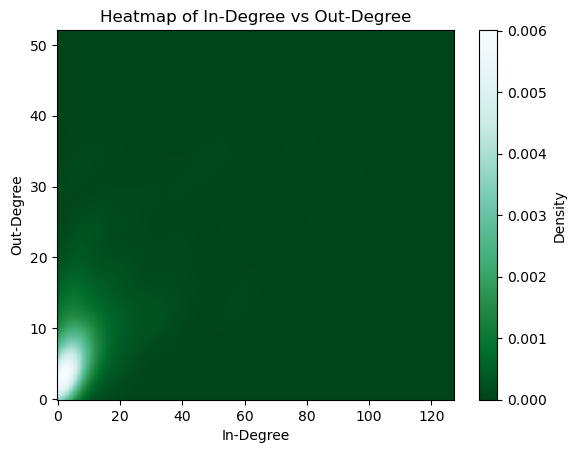

In [27]:
import numpy as np
from scipy.stats import kde

nbins = 300
k = kde.gaussian_kde([in_degrees, out_degrees])
xi, yi = np.mgrid[min(in_degrees):max(in_degrees):nbins*1j, min(out_degrees):max(out_degrees):nbins*1j]
zi = k(np.vstack([xi.flatten(), yi.flatten()]))

# Make the plot
plt.pcolormesh(xi, yi, zi.reshape(xi.shape), shading='auto', cmap=plt.cm.BuGn_r)
plt.colorbar(label='Density')
plt.title('Heatmap of In-Degree vs Out-Degree')
plt.xlabel('In-Degree')
plt.ylabel('Out-Degree')
plt.show()


>5. Why have we used directed graphs throughout this exercise? Could we have used an undirected graph instead?
>6. We have one more metric that we did not use. The node-attribute `content lenght`. There are two things we can investigate here.
>   * Firstly, we can verify that more text means more links. If that's true the length should correlate with out-degree.
>   * Secondly, and more interestingly, it could be that famous rappers have longer texts. And that means more in-links. 
>   * How should you test this? Well, here you are allowed to be **creative**. You may choose the method of your liking to study this question (e.g. look at it visually, test the correlation using spearman or pearson, fit a curve to the data, you decide). Once you've tested, let me know. Are both questions true? If yes, which phenomenon is stronger? Explain your results in your own words.

We can not use an undirected graph to analyze in and out degrees.

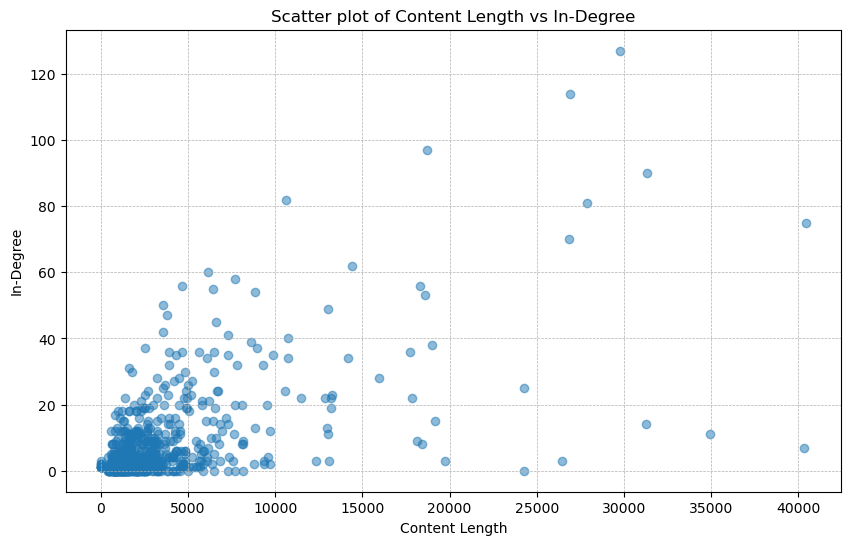

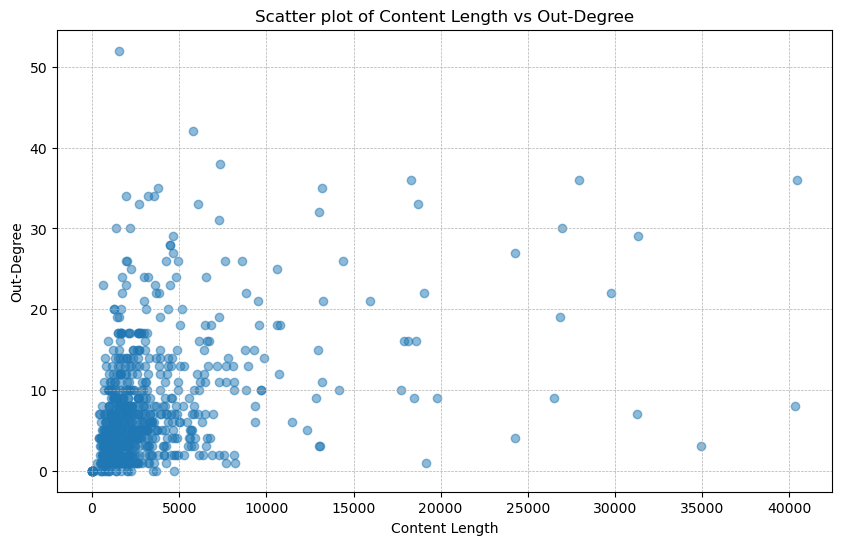

In [29]:
import matplotlib.pyplot as plt

# Extract content_length, in-degrees, and out-degrees for all nodes
content_lengths = [G.nodes[n]['content_length'] for n in G.nodes()]
in_degrees = [G.in_degree(n) for n in G.nodes()]
out_degrees = [G.out_degree(n) for n in G.nodes()]

# Scatter plot for content_length vs in-degree
plt.figure(figsize=(10,6))
plt.scatter(content_lengths, in_degrees, alpha=0.5)
plt.title('Scatter plot of Content Length vs In-Degree')
plt.xlabel('Content Length')
plt.ylabel('In-Degree')
plt.grid(True, which="both", ls="--", linewidth=0.5)
plt.show()

# Scatter plot for content_length vs out-degree
plt.figure(figsize=(10,6))
plt.scatter(content_lengths, out_degrees, alpha=0.5)
plt.title('Scatter plot of Content Length vs Out-Degree')
plt.xlabel('Content Length')
plt.ylabel('Out-Degree')
plt.grid(True, which="both", ls="--", linewidth=0.5)
plt.show()

In [6]:
import scipy.stats

# Extract content_length and in-degrees for all nodes
content_lengths = [G.nodes[n]['content_length'] for n in G.nodes()]
in_degrees = [G.in_degree(n) for n in G.nodes()]

# Calculate Spearman correlation coefficient
spearman_corr = scipy.stats.spearmanr(content_lengths, in_degrees)

print("Spearman correlation between content length and in-degree: ", spearman_corr.correlation)

Spearman correlation between content length and in-degree:  0.4704138685443712


*Exercise 2:* Centralities, assortativity and more.

Earlier, we found the most connected nodes (using degree centrality). Now let's dig in and try to understand more about the network using more advanced features. 

**Note**: Not all of the measures we'll be considering below are defined for directed graphs. Only use the undirected graph when explicitly stated in the exercise.
>1. Find the 5 most central rappers according to [degree centrality](https://networkx.org/documentation/stable/reference/algorithms/generated/networkx.algorithms.centrality.degree_centrality.html). 
>2. Find the 5 most central rappers according to [betweenness centrality](https://networkx.org/documentation/stable/auto_examples/algorithms/plot_betweenness_centrality.html?highlight=betweenness%20centrality). 

In [8]:
# Find the 5 most central rappers according to degree centrality.
degree_centrality = nx.degree_centrality(G)

# Sort the nodes by degree centrality
sorted_degree_centrality = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)

# Get the top 5
top_5_central_rappers = sorted_degree_centrality[:5]

# Print the top 5 rappers
for rapper, centrality in top_5_central_rappers:
    print(f"Rapper: {rapper}, Degree Centrality: {centrality}") #These are the highly connected rappers 

################################
print()
# Find the 5 most central rappers according to betweenness centrality
betweenness_centrality = nx.betweenness_centrality(G)

# Sort the nodes by betweenness centrality
sorted_betweenness_centrality = sorted(betweenness_centrality.items(), key=lambda x: x[1], reverse=True)

# Get the top 5
top_5_central_rappers = sorted_betweenness_centrality[:5]

# Print the top 5 rappers
for rapper, centrality in top_5_central_rappers:
    print(f"Rapper: {rapper}, Betweenness Centrality: {centrality}") 

#These are the ones with highes betweenness centrality, playing important role on bridging the rappers


Rapper: Snoop Dogg, Degree Centrality: 0.20608575380359614
Rapper: Jay-Z, Degree Centrality: 0.19917012448132781
Rapper: Nas, Degree Centrality: 0.1798063623789765
Rapper: 50 Cent, Degree Centrality: 0.16459197786998617
Rapper: Dr. Dre, Degree Centrality: 0.16182572614107885

Rapper: Snoop Dogg, Betweenness Centrality: 0.05121990770923367
Rapper: Nas, Betweenness Centrality: 0.04865022449632502
Rapper: Kendrick Lamar, Betweenness Centrality: 0.0470473962332623
Rapper: Jay-Z, Betweenness Centrality: 0.04551194379739028
Rapper: DJ Premier, Betweenness Centrality: 0.04264722255367345


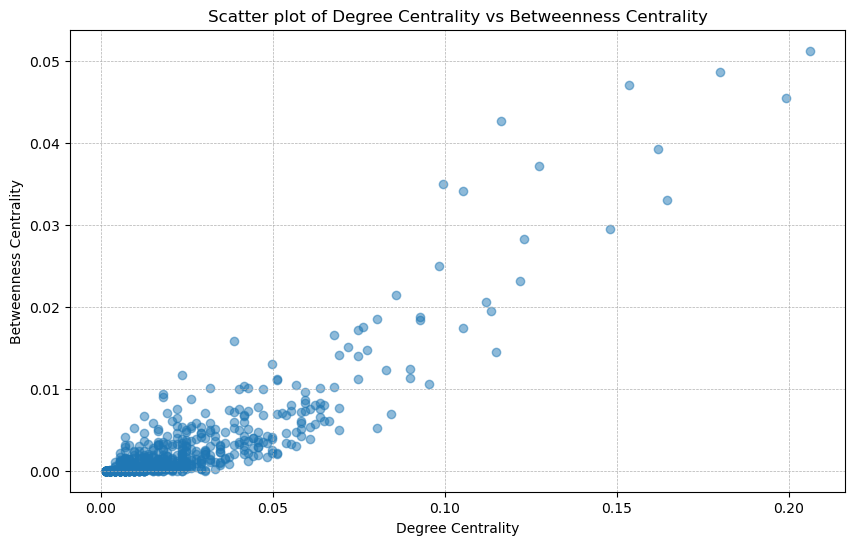

In [15]:
import matplotlib.pyplot as plt

# Extract degree centrality and betweenness centrality values
degree_centralities = list(degree_centrality.values())
betweenness_centralities = list(betweenness_centrality.values())

# Create a scatter plot
plt.figure(figsize=(10,6))
plt.scatter(degree_centralities, betweenness_centralities, alpha=0.5)
plt.title('Scatter plot of Degree Centrality vs Betweenness Centrality')
plt.xlabel('Degree Centrality')
plt.ylabel('Betweenness Centrality')
plt.grid(True, which="both", ls="--", linewidth=0.5)
plt.show()


>   * Repeat Exercise A2 or A3 (depending on which visualization method you liked the most). However, this time use betweenness centrality to define the size of the node.

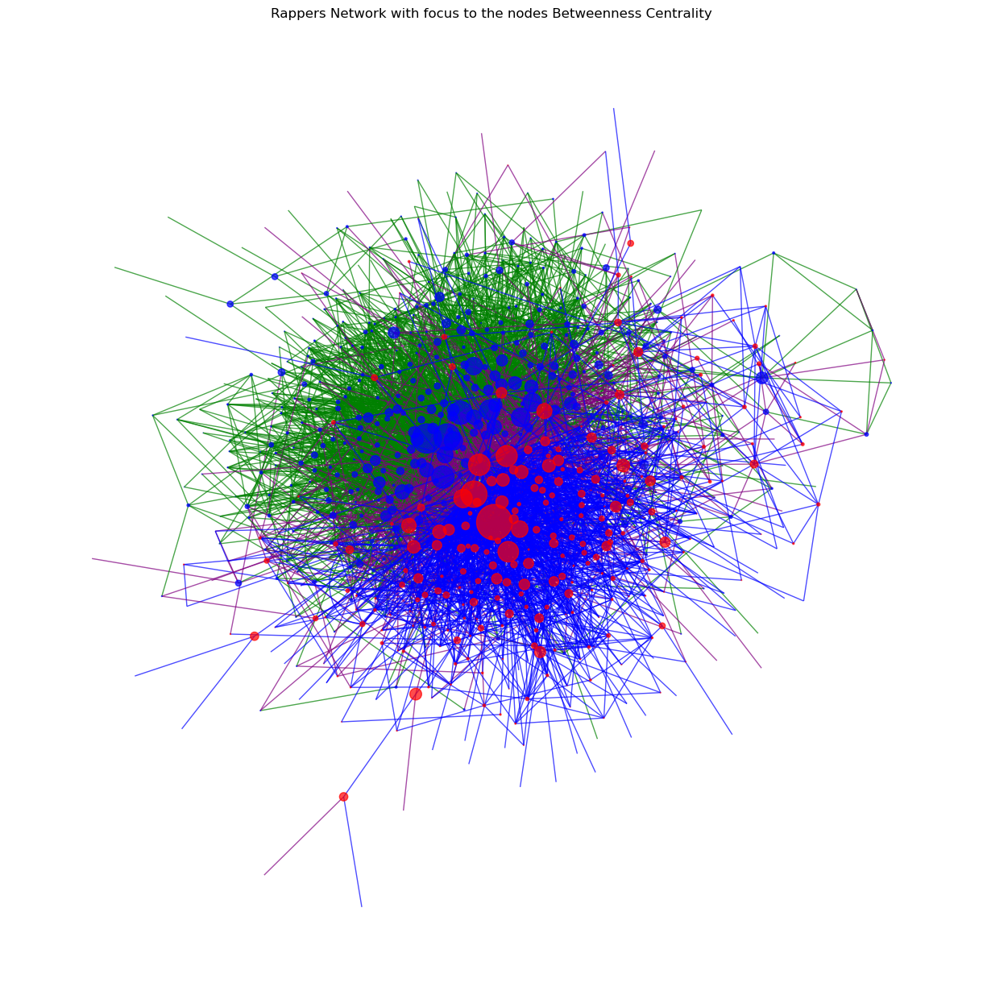

In [36]:
# Calculate betweenness centrality for each node
betweenness_centrality = nx.betweenness_centrality(G_undirected)

# Define node sizes based on betweenness centrality
node_sizes = [betweenness_centrality[node] * 10000 for node in G_undirected.nodes()]

# Define node colors based on the 'coast' attribute
color_map = {'west': 'blue', 'east': 'red'}  # Replace with actual coast values and desired colors
# Set up node colors based on the 'coast' attribute
node_colors = ['blue' if data['coast'] == 'EastCoast' else 'red' for node, data in G_undirected.nodes(data=True)]

# Define the colors
color_a = 'blue'  # for edges connecting west-coast rappers
color_b = 'green'  # for edges connecting east-coast rappers
color_c = 'purple'  # for edges connecting rappers from different coasts

# Set up edge colors
edge_colors = []
for u, v in G_undirected.edges():
    if G_undirected.nodes[u]['coast'] == 'WestCoast' and G_undirected.nodes[v]['coast'] == 'WestCoast':
        edge_colors.append(color_a)
    elif G_undirected.nodes[u]['coast'] == 'EastCoast' and G_undirected.nodes[v]['coast'] == 'EastCoast':
        edge_colors.append(color_b)
    else:
        edge_colors.append(color_c)

# Draw the graph
plt.figure(figsize=(12,12))
nx.draw_kamada_kawai(G_undirected, node_size=node_sizes, node_color=node_colors, edge_color=edge_colors, with_labels=False, alpha=0.7)
plt.title('Rappers Network with focus to the nodes Betweenness Centrality')
# Display the plot
plt.show()

>   * What role do you imagine rappers with high betweenness centrality play on  Wikipedia? 

- Rappers with higher betweenness centrality are the ones connecting more rappers, functioning as a bridge.

>3. Find the 5 most central rappers according to eigenvector centrality. Calculate centrality corresponding to both in- and out-edges (see [NetworkX documentation](https://networkx.org/documentation/stable/reference/algorithms/generated/networkx.algorithms.centrality.eigenvector_centrality.html#networkx.algorithms.centrality.eigenvector_centrality) for details). 
>   * Repeat Exercise A2 or A3 (depending on which visualization method you liked the most). However, this time use eigenvector centrality to define the size of the node.
>   * What role do you imagine rappers with high wikipedia graph eigenvector centrality play? 

In [24]:
# Calculate out-eigenvector centrality (default)
out_eigenvector_centrality = nx.eigenvector_centrality_numpy(G)

# Sort nodes by out-eigenvector centrality
sorted_out_eigenvector_centrality = sorted(out_eigenvector_centrality.items(), key=lambda x: x[1], reverse=True)

# Get the top 5 nodes with highest out-eigenvector centrality
top_5_out_eigenvector_rappers = sorted_out_eigenvector_centrality[:5]

# Print the top 5 rappers with highest out-eigenvector centrality
print("Top 5 rappers according to Out-Eigenvector Centrality:")
for rapper, centrality in top_5_out_eigenvector_rappers:
    print(f"Rapper: {rapper}, Out-Eigenvector Centrality: {centrality}")
print()
# Reverse the graph to calculate in-eigenvector centrality
G_reverse = G.reverse()

# Calculate in-eigenvector centrality for the reversed graph
in_eigenvector_centrality = nx.eigenvector_centrality_numpy(G_reverse)

# Sort nodes by in-eigenvector centrality
sorted_in_eigenvector_centrality = sorted(in_eigenvector_centrality.items(), key=lambda x: x[1], reverse=True)

# Get the top 5 nodes with highest in-eigenvector centrality
top_5_in_eigenvector_rappers = sorted_in_eigenvector_centrality[:5]

# Print the top 5 rappers with highest in-eigenvector centrality
print("Top 5 rappers according to In-Eigenvector Centrality:")
for rapper, centrality in top_5_in_eigenvector_rappers:
    print(f"Rapper: {rapper}, In-Eigenvector Centrality: {centrality}")

Top 5 rappers according to Out-Eigenvector Centrality:
Rapper: Jay-Z, Out-Eigenvector Centrality: 0.3032845841644411
Rapper: 50 Cent, Out-Eigenvector Centrality: 0.25160238977871635
Rapper: Nas, Out-Eigenvector Centrality: 0.251153313897597
Rapper: Dr. Dre, Out-Eigenvector Centrality: 0.23782398682894162
Rapper: Snoop Dogg, Out-Eigenvector Centrality: 0.22613828228328378

Top 5 rappers according to In-Eigenvector Centrality:
Rapper: Drag-On, In-Eigenvector Centrality: 0.13798180554663478
Rapper: Kurupt, In-Eigenvector Centrality: 0.1356243795762357
Rapper: Dr. Dre, In-Eigenvector Centrality: 0.13227905433981452
Rapper: DJ Dahi, In-Eigenvector Centrality: 0.13146292559068842
Rapper: Jahlil Beats, In-Eigenvector Centrality: 0.13007039619372524


c:\Users\boran\anaconda3\envs\SocialGraphs\Lib\site-packages\matplotlib\collections.py:963: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor
c:\Users\boran\anaconda3\envs\SocialGraphs\Lib\site-packages\networkx\drawing\nx_pylab.py:763: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(marker_size) / 2


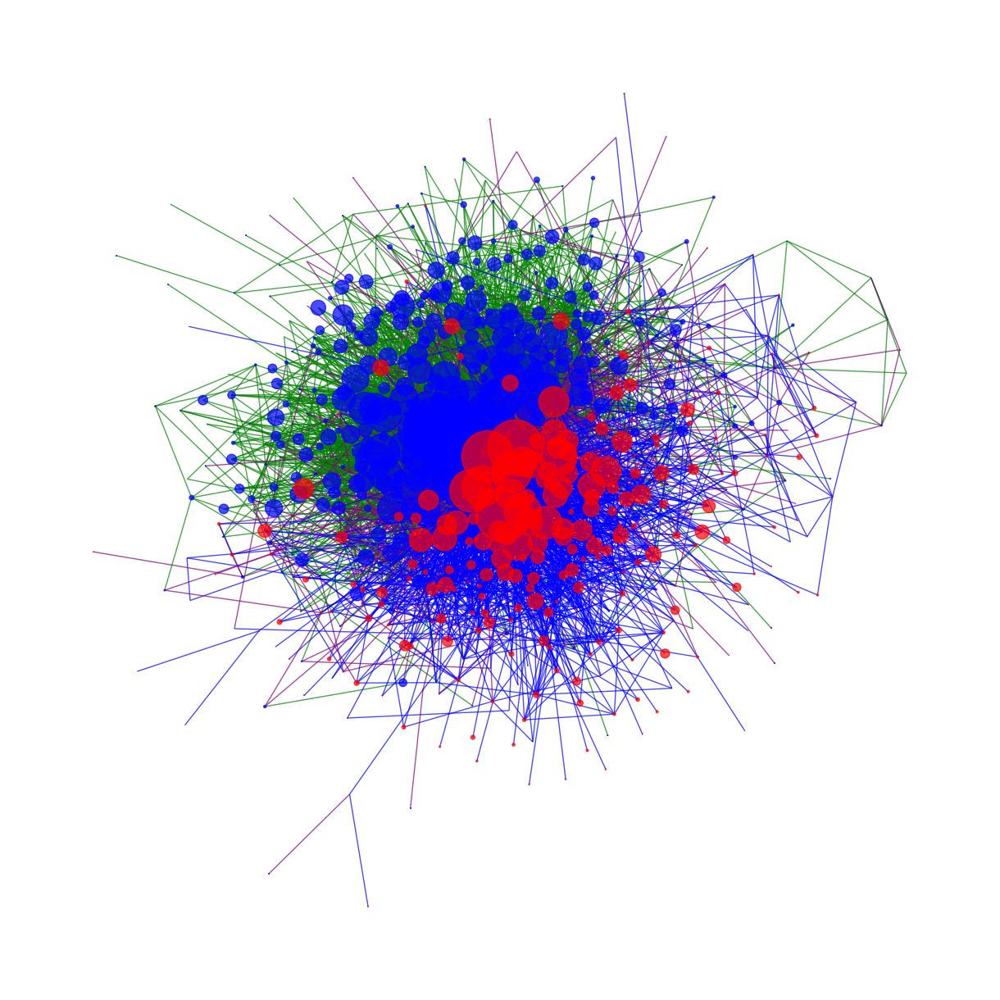

In [26]:
# Calculate eigenvector centrality for the directed graph
eigenvector_centrality = nx.eigenvector_centrality_numpy(G)

# Define node sizes based on eigenvector centrality
node_sizes = [eigenvector_centrality[node] * 10000 for node in G.nodes()]

# Set up node colors based on the 'coast' attribute
node_colors = ['blue' if data['coast'] == 'EastCoast' else 'red' for node, data in G_undirected.nodes(data=True)]

# Define the colors
color_a = 'blue'  # for edges connecting west-coast rappers
color_b = 'green'  # for edges connecting east-coast rappers
color_c = 'purple'  # for edges connecting rappers from different coasts

# Set up edge colors
edge_colors = []
for u, v in G_undirected.edges():
    if G_undirected.nodes[u]['coast'] == 'WestCoast' and G_undirected.nodes[v]['coast'] == 'WestCoast':
        edge_colors.append(color_a)
    elif G_undirected.nodes[u]['coast'] == 'EastCoast' and G_undirected.nodes[v]['coast'] == 'EastCoast':
        edge_colors.append(color_b)
    else:
        edge_colors.append(color_c)

# Draw the graph
plt.figure(figsize=(12,12))
nx.draw_kamada_kawai(G_undirected, node_size=node_sizes, node_color=node_colors, edge_color=edge_colors, with_labels=False, alpha=0.7)

# Display the plot
plt.show()

* The rappers in top_5_out_eigenvector_rappers are those who are connected to other highly influential rappers, making them influential in the network.
* The rappers in top_5_in_eigenvector_rappers are those who are referenced by other highly influential rappers, indicating their influence and recognition within the network.

>4. Is the undirected version of the graph assortative with respect to degree? (e.g. do high-degree rappers tend to link to other high-degree rappers, and low-degree rappers to other low-degree rappers?). Provide an interpretation of your answer.
>5. Is the undirected version of the graph assortative with respect do the `content length` nodal properties? (e.g. do rappers with long Wikipedia pages tend to link to other rappers with long Wiki pages, and *vice versa*?. Hint: Use [this function](https://networkx.github.io/documentation/stable/reference/algorithms/generated/networkx.algorithms.assortativity.attribute_assortativity_coefficient.html#networkx.algorithms.assortativity.attribute_assortativity_coefficient). Provide an interpretation of your answer.
>6. Is the undirected version of the graph assortative with respect to Coast? (e.g. west-coast rappers tending to link to west-coast rappers, etc.). Provide an interpretation of your answer.
>7. What is the average shortest path length? Is it similar to the one of a random graph with the same number of nodes $N$  and probablity of connection $p$?
>   * Take a look at the *distribution* of shortest paths for the two networks (create a histogram for each network) to better compare and contrast. Explain what you see in your own words.

In [27]:
# Calculate degree assortativity coefficient
assortativity_coefficient = nx.degree_assortativity_coefficient(G_undirected)

# Print the assortativity coefficient
print("Degree Assortativity Coefficient: ", assortativity_coefficient)

Degree Assortativity Coefficient:  -0.033807771305347865


The degree assortavitiy coefficient is -0.03. It is negative, which means that the high-degree nodes tend to connect with low-degree nodes. But it is also very close to 0, so the pattern is not very strong.

In [28]:
# Calculate attribute assortativity coefficient for 'content length'
content_length_assortativity = nx.attribute_assortativity_coefficient(G_undirected, 'content_length')

# Print the assortativity coefficient
print("Content Length Assortativity Coefficient: ", content_length_assortativity)

Content Length Assortativity Coefficient:  -0.0031755702102967947


Similar to before, the coefficient is negative - which means that the rappers with longer wikipedia pages tend to connect with the rappers with shorter wikipedia pages. But the coefficient is again close to 0, which makes the pattern not very strong.

In [29]:
# Calculate attribute assortativity coefficient for 'coast'
coast_assortativity = nx.attribute_assortativity_coefficient(G_undirected, 'coast')

# Print the assortativity coefficient
print("Coast Assortativity Coefficient: ", coast_assortativity)

Coast Assortativity Coefficient:  0.5273120113344177


Finally we get a positive, and relatively large coefficient when we analyze the attribute assortativity coefficient for 'coast'. It implies that generally rappers from the same coast tend to connect with each other.

In [31]:
# Calculate the average shortest path length for the graph
avg_shortest_path_length = nx.average_shortest_path_length(G_undirected)
print("Average Shortest Path Length: ", avg_shortest_path_length)

Average Shortest Path Length:  2.9909026997699883


In [32]:
# Number of nodes and edges in the original graph
N = G_undirected.number_of_nodes()
L = G_undirected.number_of_edges()

# Calculate the probability of connection p
p = L / (N * (N - 1) / 2)

# Generate a random graph with N nodes and probability p
G_random = nx.erdos_renyi_graph(N, p)

# Calculate the average shortest path length for the random graph
avg_shortest_path_length_random = nx.average_shortest_path_length(G_random)
print("Average Shortest Path Length of Random Graph: ", avg_shortest_path_length_random)

Average Shortest Path Length of Random Graph:  2.801934083736427


* Both values are relatively low, suggesting that both graphs exhibit the small-world property, characteristic of many real-world networks, where most nodes can be reached from every other by a small number of steps.

* The slightly higher value in the real network (2.99 compared to 
2.80) could suggest that the real network is a bit more clustered or modular compared to the random network. In a more clustered network, nodes tend to form tightly knit groups characterized by a relatively high density of ties; this could lead to a slightly longer path length compared to a random network.

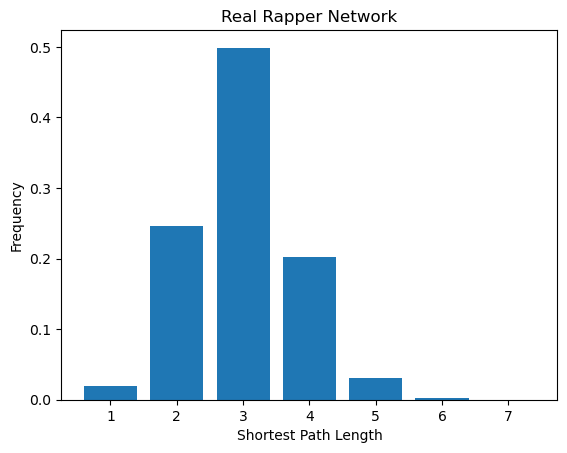

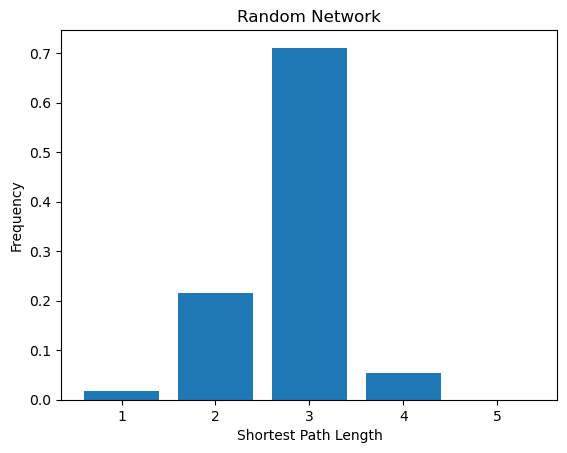

In [37]:
def plot_shortest_path_histogram(G, title):
    # Calculate shortest path lengths between all pairs of nodes
    path_lengths = nx.shortest_path_length(G)
    
    # Extract the path lengths
    lengths = []
    for source, targets in path_lengths:
        for target, length in targets.items():
            if source != target:  # Exclude the self-loops
                lengths.append(length)
                
    # Plot histogram
    plt.hist(lengths, bins=range(1, max(lengths) + 2), align='left', rwidth=0.8, density=True)
    plt.title(title)
    plt.xlabel('Shortest Path Length')
    plt.ylabel('Frequency')
    plt.show()

# Plot histogram for the real network
plot_shortest_path_histogram(G_undirected, 'Real Rapper Network')

# Plot histogram for the random network
plot_shortest_path_histogram(G_random, 'Random Network')


* Community Structure: The more distributed path lengths in the real network could be indicative of a community structure, where different communities have different internal densities and are connected by relatively fewer inter-community links, leading to varying path lengths.
* Hierarchy and Central Nodes: The presence of shorter and longer path lengths in the real network might also suggest the existence of central nodes or hubs that connect different parts of the network, leading to shorter paths, and hierarchical structures that can increase the path lengths.
* Homogeneity in Random Networks: The concentration of path lengths around a specific value in the random network is characteristic of the homogeneity in connectivity in such networks, where the lack of community structure and hierarchy leads to more uniform and predictable path lengths.

*Exercise 3*: Is the coast of a rapper important for the network structure? Let us explore if and how it shapes the network (use the undirected network). 
>1. Compute the average node centrality for west-coast and east-coast rappers respectively. You are free to choose your favourite centrality measure or compare different ones. Which coast do the more central rappers have?

In [41]:
# Calculate Degree Centrality for each node in the graph
degree_centrality = nx.degree_centrality(G)

# Initialize sums and counts for each coast
sum_west = count_west = sum_east = count_east = 0

# Iterate over nodes and sum up the centralities for each coast
for node, centrality in degree_centrality.items():
    coast = G.nodes[node].get('coast')  # Ensure 'coast' is the correct attribute name
    if coast == 'WestCoast':
        sum_west += centrality
        count_west += 1
    elif coast == 'EastCoast':
        sum_east += centrality
        count_east += 1

# Calculate the average centrality for each coast
avg_centrality_west = sum_west / max(count_west, 1)  # Avoid division by zero
avg_centrality_east = sum_east / max(count_east, 1)  # Avoid division by zero

# Print the average centralities
print("Average Degree Centrality for West-Coast Rappers: ", avg_centrality_west)
print("Average Degree Centrality for East-Coast Rappers: ", avg_centrality_east)


Average Degree Centrality for West-Coast Rappers:  0.01997947619685
Average Degree Centrality for East-Coast Rappers:  0.023633411510012567


In [43]:
# Calculate Degree Centrality for each node in the graph
betweenness_centrality = nx.betweenness_centrality(G_undirected)

# Initialize sums and counts for each coast
sum_west = count_west = sum_east = count_east = 0

# Iterate over nodes and sum up the centralities for each coast
for node, centrality in betweenness_centrality.items():
    coast = G.nodes[node].get('coast')  # Ensure 'coast' is the correct attribute name
    if coast == 'WestCoast':
        sum_west += centrality
        count_west += 1
    elif coast == 'EastCoast':
        sum_east += centrality
        count_east += 1

# Calculate the average centrality for each coast
avg_b_centrality_west = sum_west / max(count_west, 1)  # Avoid division by zero
avg_b_centrality_east = sum_east / max(count_east, 1)  # Avoid division by zero

# Print the average centralities
print("Average Betweenness Centrality for West-Coast Rappers: ", avg_b_centrality_west)
print("Average Betweenness Centrality for East-Coast Rappers: ", avg_b_centrality_east)


Average Betweenness Centrality for West-Coast Rappers:  0.0028311320942181247
Average Betweenness Centrality for East-Coast Rappers:  0.002702335063984809


In [44]:
eigenvector_centrality = nx.eigenvector_centrality(G)

# Initialize sums and counts for each coast
sum_west = count_west = sum_east = count_east = 0

# Iterate over nodes and sum up the centralities for each coast
for node, centrality in eigenvector_centrality.items():
    coast = G.nodes[node].get('coast')
    if coast == 'WestCoast':
        sum_west += centrality
        count_west += 1
    elif coast == 'EastCoast':
        sum_east += centrality
        count_east += 1

# Calculate the average centrality for each coast
avg_centrality_west = sum_west / count_west if count_west > 0 else 0
avg_centrality_east = sum_east / count_east if count_east > 0 else 0

# Print the average centralities
print("Average Eigenvector Centrality for West-Coast Rappers: ", avg_centrality_west)
print("Average Eigenvector Centrality for East-Coast Rappers: ", avg_centrality_east)

Average Eigenvector Centrality for West-Coast Rappers:  0.011515846143081161
Average Eigenvector Centrality for East-Coast Rappers:  0.0180955910486113


>2. Create a randomized version of the full graph, where the association between nodes and coast is shuffled. Compute the average centrality of west-coast and east-coast rappers for this randomized graph. 
>   * **Hint**: To create this shuffling, simply give everyone a random coast assignment (but with the same number of west-coast and east-coast rappers as in the real data). The way I usually create random lables is by using either [`random.shuffle`](https://docs.python.org/3/library/random.html#random.shuffle) or [`numpy.random.permutation`](https://docs.scipy.org/doc/numpy/reference/generated/numpy.random.permutation.html).

In [47]:
import numpy as np

G_randomized = G.copy()

# Extract coast attributes from all nodes
coasts = [data['coast'] for node, data in G_randomized.nodes(data=True) if 'coast' in data]

# Shuffle the coast attributes
np.random.permutation(coasts)

# Assign the shuffled coast attributes back to the nodes
for i, (node, data) in enumerate(G_randomized.nodes(data=True)):
    if 'coast' in data:
        data['coast'] = coasts[i]

# Calculate Centrality for each node in the randomized graph
degree_centrality = nx.degree_centrality(G_randomized)

# Initialize sums and counts for each coast
sum_west = count_west = sum_east = count_east = 0

# Iterate over nodes and sum up the centralities for each coast in the randomized graph
for node, centrality in degree_centrality.items():
    coast = G_randomized.nodes[node].get('coast')
    if coast == 'WestCoast':
        sum_west += centrality
        count_west += 1
    elif coast == 'EastCoast':
        sum_east += centrality
        count_east += 1

# Calculate the average centrality for each coast in the randomized graph
avg_centrality_west_random = sum_west / count_west if count_west > 0 else 0
avg_centrality_east_random = sum_east / count_east if count_east > 0 else 0

# Print the average centralities for the randomized graph
print("Average Degree Centrality for West-Coast Rappers (Randomized): ", avg_centrality_west_random)
print("Average Degree Centrality for East-Coast Rappers (Randomized): ", avg_centrality_east_random)

Average Degree Centrality for West-Coast Rappers (Randomized):  0.01997947619685
Average Degree Centrality for East-Coast Rappers (Randomized):  0.023633411510012567


When you shuffle the 'coast' attribute, the nodes still retain their original degree (number of connections), but they might get a different 'coast' attribute. Since the degree of the nodes is not altered during this process, the average degree centrality for the nodes originally labeled as 'West-Coast' and 'East-Coast' remains the same, even though the 'coast' labels themselves have been shuffled among nodes.

>3. Repeat the shuffling process above 1000 times (at least) and plot two histograms, each histogram with the 1000 corresponding average values of centrality obtained for west-coast and east-coast rappers in the shuffeled netowrks.
>4. Compare the value you have obtained in the real graph, with the randomized cases. Are rappers from one coast more central in the network (on average)?
>5. Think about your results, what could be possible explanations for what you observe?

The shuffling procedure you just carried out is often called a _permutation test_. It is a super powerful tool that we use all the time. Once you start to think about it, you can answer many questions of the type "Is [property] higher/lower in this network than one might have expected by chance?" with permutation tests.

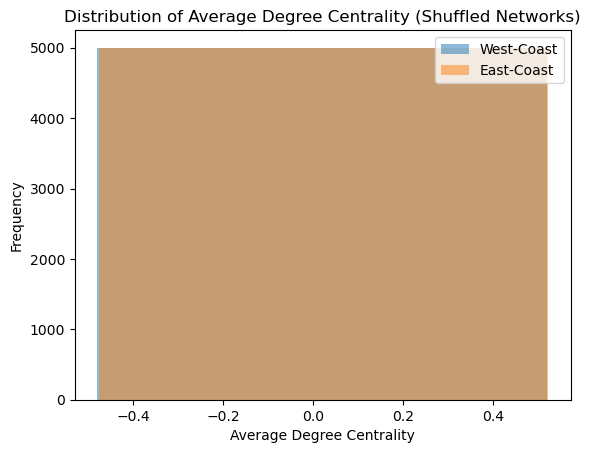

In [49]:
# Initialize lists to store the average centralities for each shuffle
avg_centralities_west = []
avg_centralities_east = []

# Number of shuffles
num_shuffles = 5000

# Perform the shuffling process multiple times
for _ in range(num_shuffles):
    # Create a copy of the original graph for each shuffle
    G_randomized = G.copy()

    # Extract and shuffle the 'coast' attributes
    coasts = [data['coast'] for node, data in G_randomized.nodes(data=True) if 'coast' in data]
    np.random.permutation(coasts)

    # Assign the shuffled 'coast' attributes back to the nodes in the randomized graph
    for i, (node, data) in enumerate(G_randomized.nodes(data=True)):
        if 'coast' in data:
            data['coast'] = coasts[i]

    # Calculate Degree Centrality for each node in the randomized graph
    degree_centrality = nx.degree_centrality(G_randomized)

    # Initialize sums and counts for each coast
    sum_west = count_west = sum_east = count_east = 0

    # Iterate over nodes and sum up the centralities for each coast in the randomized graph
    for node, centrality in degree_centrality.items():
        coast = G_randomized.nodes[node].get('coast')
        if coast == 'WestCoast':
            sum_west += centrality
            count_west += 1
        elif coast == 'EastCoast':
            sum_east += centrality
            count_east += 1

    # Calculate and store the average centrality for each coast in the randomized graph
    avg_centralities_west.append(sum_west / count_west if count_west > 0 else 0)
    avg_centralities_east.append(sum_east / count_east if count_east > 0 else 0)

# Plot the histograms
plt.hist(avg_centralities_west, alpha=0.5, label='West-Coast', bins='auto')
plt.hist(avg_centralities_east, alpha=0.5, label='East-Coast', bins='auto')
plt.xlabel('Average Degree Centrality')
plt.ylabel('Frequency')
plt.legend(loc='upper right')
plt.title('Distribution of Average Degree Centrality (Shuffled Networks)')
plt.show()


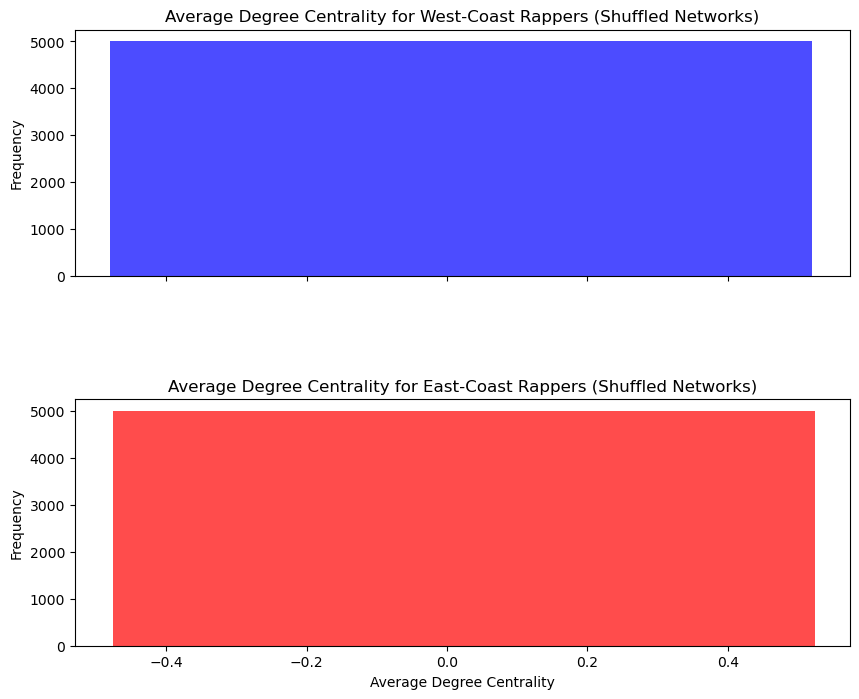

In [50]:
# Set up the figure and axis for the subplot
fig, axs = plt.subplots(2, 1, sharex=True, sharey=True, gridspec_kw={'hspace': 0.5}, figsize=(10,8))

# Plot the histogram for West-Coast rappers
axs[0].hist(avg_centralities_west, bins='auto', color='blue', alpha=0.7)
axs[0].set_title('Average Degree Centrality for West-Coast Rappers (Shuffled Networks)')
axs[0].set_ylabel('Frequency')

# Plot the histogram for East-Coast rappers
axs[1].hist(avg_centralities_east, bins='auto', color='red', alpha=0.7)
axs[1].set_title('Average Degree Centrality for East-Coast Rappers (Shuffled Networks)')
axs[1].set_xlabel('Average Degree Centrality')
axs[1].set_ylabel('Frequency')

plt.show()

If the histograms overlap significantly, it suggests that the difference in average centrality between West-Coast and East-Coast rappers is not significant and could be due to random chance.

The consistent observation of the same average degree centrality values for West-Coast and East-Coast rappers, even after multiple shuffles, indicates that the centrality measure is not dependent on the 'coast' attribute of the nodes but is inherent to the network structure.

### Interpretation:
__Network Structure__:

The consistent average centrality values suggest that the overall network structure and the connections between nodes are the primary determinants of the centrality values, rather than the 'coast' attribute. The 'coast' attribute is a label assigned to the nodes, and shuffling these labels does not alter the underlying network structure or the centrality measures derived from it.
Centrality Independence:

The independence of the centrality measure from the 'coast' attribute implies that, on average, rappers from one coast are not more central in the network compared to the other coast, when considering the degree centrality measure. The observed centrality values are a function of the node degrees, which remain constant regardless of how the 'coast' labels are assigned.

__Equal Representation__:

If the number of West-Coast and East-Coast rappers is approximately equal, the average centrality values for both coasts would be expected to be similar, as observed, since the total degree (sum of in-degree and out-degree) in the network remains constant.
Possible Explanations:
Random Assignment:

The consistent results after shuffling suggest that the original assignment of the 'coast' attribute to the nodes could be arbitrary or random with respect to the network structure, and it does not have a significant impact on the centrality measures.
Diverse Connections:

The network might have diverse connections between rappers from both coasts, leading to similar centrality values. It implies that the collaboration or interaction between rappers is not limited by their coast, resulting in a balanced and integrated network structure.

__Centrality Measure Limitation__:

Degree centrality is a local measure that considers only the immediate neighbors of a node. It does not account for the global network structure or the importance of the neighbors. Exploring other centrality measures like betweenness, closeness, or eigenvector centrality might provide different insights and reveal other aspects of the network structure related to the 'coast' attribute.

_Conclusion_:
The observation that the average degree centrality remains constant for both coasts, even after multiple shuffles, suggests that the 'coast' attribute does not play a significant role in determining the centrality of the nodes in the network. The network structure, characterized by the connections between nodes, is the primary factor influencing the centrality values, and any observed differences in centrality are likely inherent to the network structure rather than being associated with the 'coast' attribute.